In [54]:
import pandas as pd
import numpy as np
import warnings
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, accuracy_score

# Load your dataset

In [27]:
data = pd.read_csv('forest_fire.csv')

# Handle Missing Values

In [28]:
data.head(5)

,Unnamed: 0,Temperature,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUILD_UP_INDEX,fireweather_index,Classes
0,0,31.06,63.90,12.01,0.83,89.68,13.58,66.92,4.02,18.018709,276.036833,1
1,1,26.12,33.77,0.40,0.10,90.54,168.05,797.39,2.96,220.122774,3900.723441,1
2,2,21.63,47.55,14.28,0.00,89.41,7.63,100.98,14.29,12.835407,657.463954,1
3,3,19.60,45.00,3.10,0.00,91.90,111.70,770.30,6.50,163.960764,6049.978771,1
4,4,21.74,95.44,20.94,0.00,82.10,31.80,6.90,1.80,5.079167,27.722391,0


In [29]:
data = data.drop('Unnamed: 0',axis =1)

In [30]:
imputer = SimpleImputer(strategy='mean')
X = data.drop(columns=['Classes'])
y = data['Classes']
X_imputed = imputer.fit_transform(X)

# Data Visualization

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

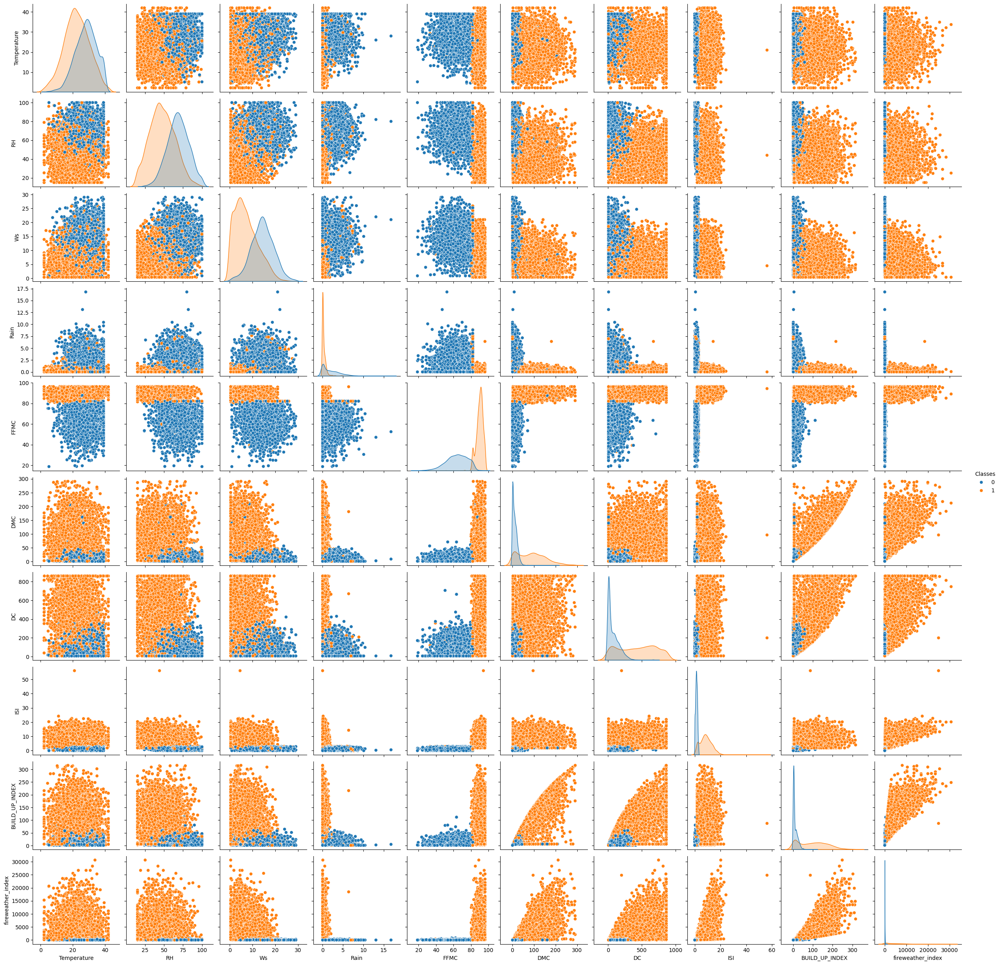

In [32]:
sns.pairplot(data, hue='Classes')
plt.show()

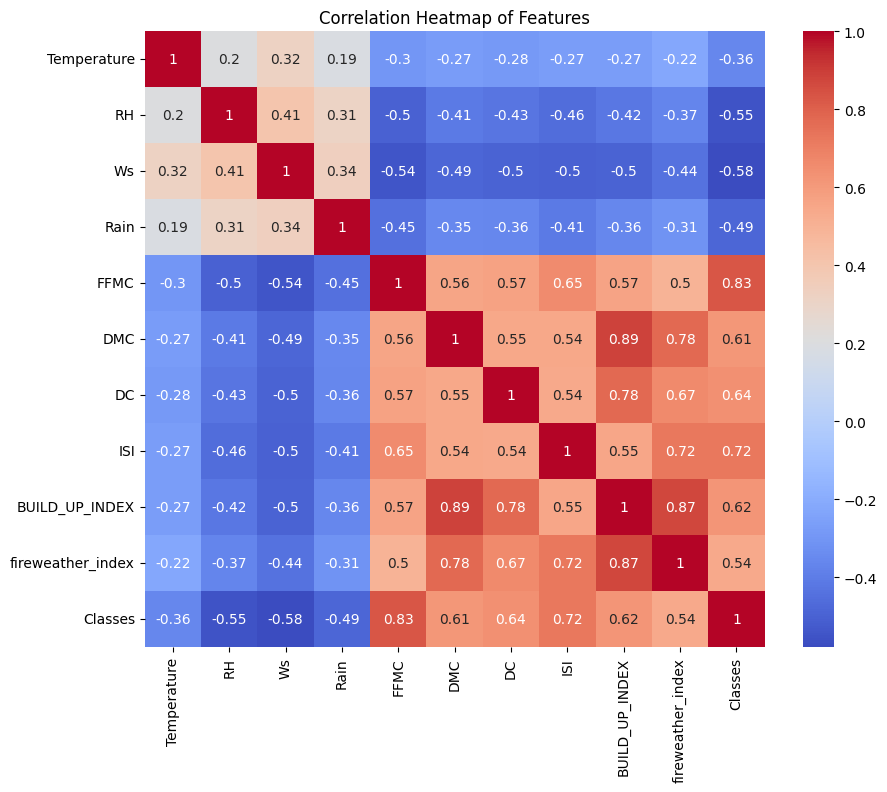

In [33]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Features')
plt.show()

In [34]:
x= data[['Temperature',	'RH'	,'Ws',	'Rain',	'FFMC'	,'DMC',	'DC'	,'ISI',	'BUILD_UP_INDEX',	'fireweather_index']]

In [35]:
y=data['Classes']

# Split the data into training and testing sets

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

# Train Random Forest

In [37]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

# Model Evaluvation

In [38]:
y_pred = rf.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[505   9]
 [  5 693]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       514
           1       0.99      0.99      0.99       698

    accuracy                           0.99      1212
   macro avg       0.99      0.99      0.99      1212
weighted avg       0.99      0.99      0.99      1212



In [39]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9884488448844885


# Error calculation


In [40]:
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

rmse = np.sqrt(mse)
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 0.01155115511551155
Root Mean Squared Error: 0.107476300250388


# Feature importance plot

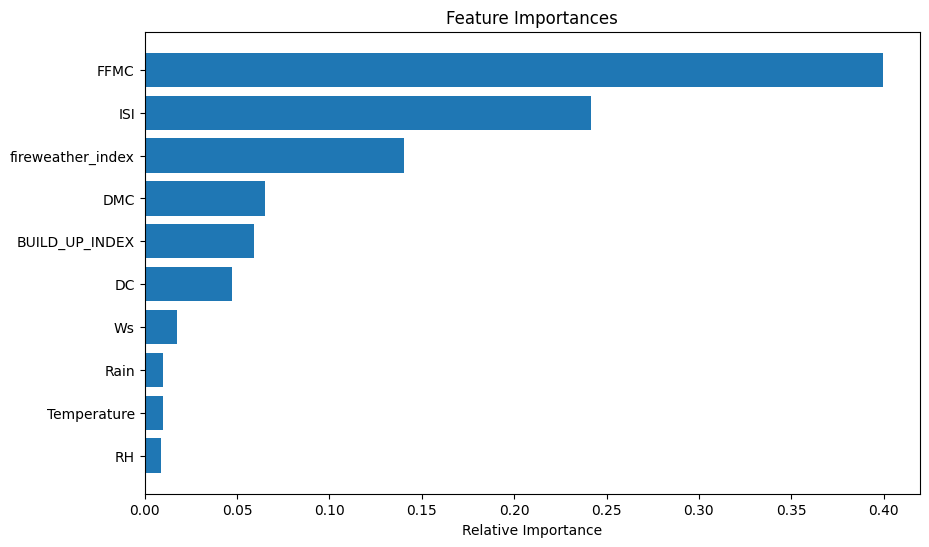

In [41]:
importances = rf.feature_importances_
feature_names = data.columns[:-1]
indices = np.argsort(importances)

plt.figure(figsize=(10, 6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), feature_names[indices])
plt.xlabel('Relative Importance')
plt.show()


# Data Visualization

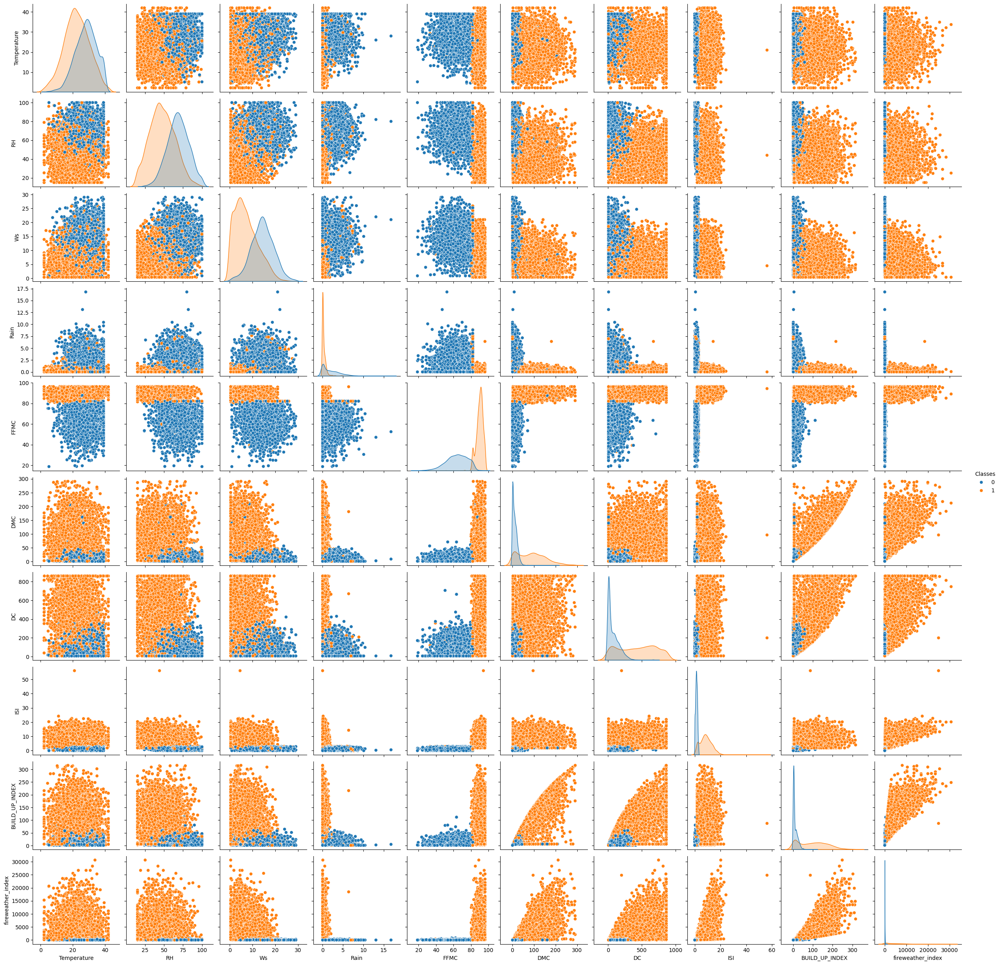

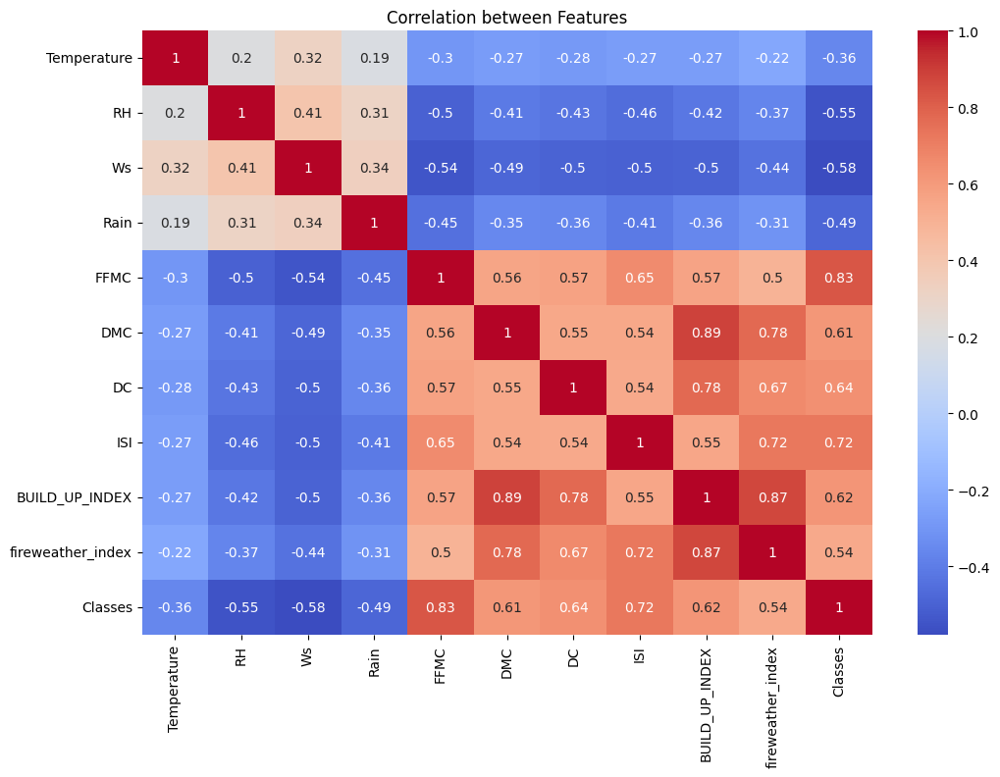

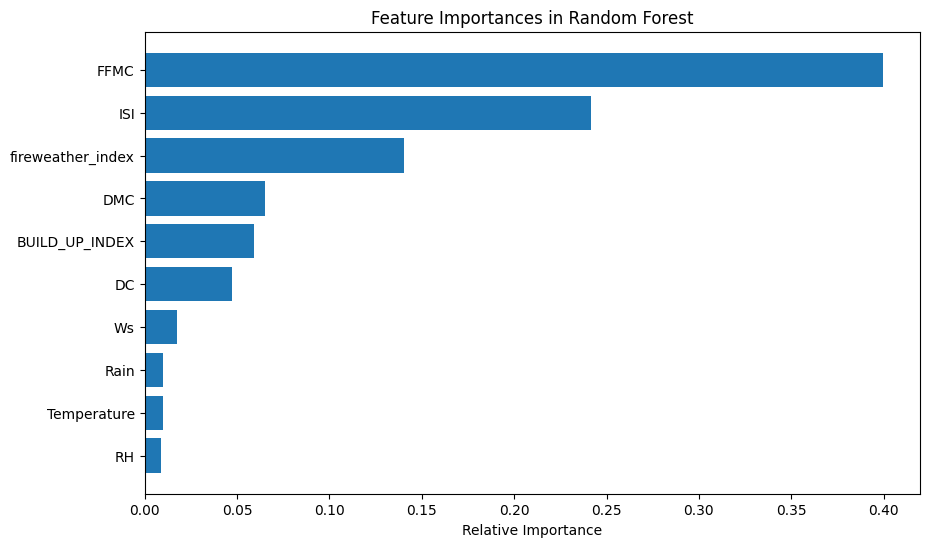

In [42]:

sns.pairplot(data, hue='Classes')
plt.show()


plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation between Features')
plt.show()

plt.figure(figsize=(10, 6))
plt.title('Feature Importances in Random Forest')
plt.barh(range(len(importances)), importances[indices], align='center')
plt.yticks(range(len(indices)), feature_names[indices])
plt.xlabel('Relative Importance')
plt.show()



# Predicting if fire would occur or not

In [43]:
sample_input = np.array([[30.0, 50.0, 10.0, 0.5, 80.0, 20.0, 200.0, 5.0, 6.87,148]])

sample_prediction = rf.predict(sample_input)
print(f'Sample Prediction (0 = No Fire, 1 = Fire): {sample_prediction[0]}')

Sample Prediction (0 = No Fire, 1 = Fire): 1


 # Intensity to predict Forest Fire


In [44]:



fire_data = data[data['Classes'] == 1]


X = fire_data[['Temperature', 'RH', 'Ws', 'Rain', 'FFMC', 'DMC', 'DC', 'ISI']]  
y = fire_data['fireweather_index'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest Regressor model

In [45]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)


rf_model.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

# Make predictions on the test set using Random Forest model

In [46]:


y_pred_rf = rf_model.predict(X_test)


# Sample input for prediction (example values)

In [53]:

sample_input = np.array([[31.06,63.9,12.01,0.83,89.68,13.58,66.92,4.02]])

predicted_intensity_rf = rf_model.predict(sample_input)
print(f'Sample Prediction (Random Forest) - Predicted Fire Intensity: {predicted_intensity_rf[0]:.2f}')

warnings.filterwarnings("ignore")


Sample Prediction (Random Forest) - Predicted Fire Intensity: 298.41
